# Feature Pyramid Network (object detection)

- The object detection model is an FPN which is built on top of a standard convolutional neural network (CNN) like ResNet.

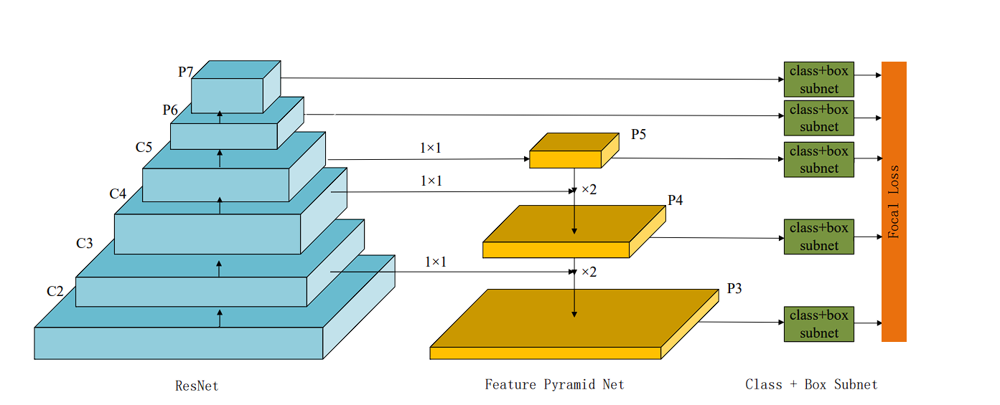

- ResNet (Residual Network), is a type of CNN architecture that solves the vanishing gradient problem, during training very deep neural networks.

- As networks grow deeper, the network tends to suffer from a vanishing gradient. This is when the gradients used in training become so small that learning   effectively stops due to activation functions squashing the gradients.

- ResNet solves this problem by propagating the gradient throughout the network. The output from an earlier layer is added to the output of a later layer, helping to preserve the gradient sometimes lost in deeper networks. This allows for the training of networks with a depth of over 100 layers.

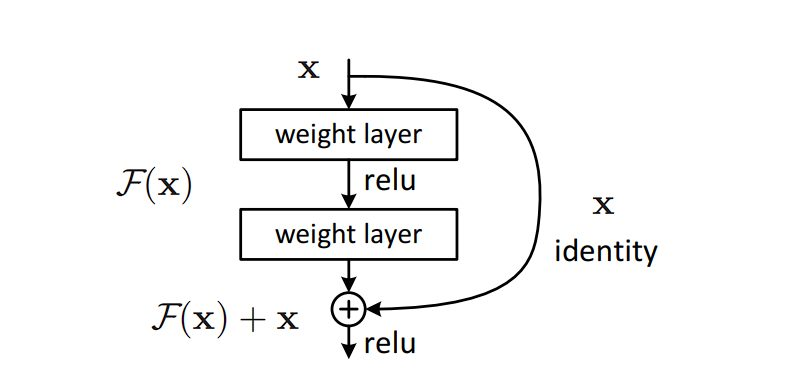

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os, cv2
import xml.etree.ElementTree as ET
import tensorflow as tf

devices = tf.config.experimental.list_physical_devices("GPU")
for device in devices:
    tf.config.experimental.set_memory_growth(device=device, enable=True)
    
from tensorflow import keras
from keras import Sequential, Model

### Image and Label Preprocessing

1. There are 20 classes in the PASCAL VOC dataset, and 1 extra class (None) will be added to refer the background class indicating presence og no object.

2. The image and all the ground truth bounding boxes will be rescaled to (416,416,3).

In [2]:
LABELS_bf = ['None','aeroplane',  'bicycle', 'bird',  'boat',      'bottle', 
          'bus',        'car',      'cat',  'chair',     'cow',
          'diningtable','dog',    'horse',  'motorbike', 'person',
          'pottedplant','sheep',  'sofa',   'train',   'tvmonitor']

LABELS = ['aeroplane',  'bicycle', 'bird',  'boat',      'bottle', 
          'bus',        'car',      'cat',  'chair',     'cow',
          'diningtable','dog',    'horse',  'motorbike', 'person',
          'pottedplant','sheep',  'sofa',   'train',   'tvmonitor']

train_image_folder = "JPEGImages/"
train_annot_folder = "Annotations/"

In [3]:
def parse_annotation(ann_dir, img_dir, labels=[]):
    '''
    output:
    - Each element of the train_image is a dictionary containing the annoation infomation of an image.
    - seen_train_labels is the dictionary containing
            (key, value) = (the object class, the number of objects found in the images)
    '''
    all_imgs = []
    seen_labels = {}
    
    for ann in sorted(os.listdir(ann_dir)):
        if "xml" not in ann:
            continue
        img = {'object':[]}

        tree = ET.parse(ann_dir + ann)
        
        for elem in tree.iter():
            if 'filename' in elem.tag:
                path_to_image = img_dir + elem.text
                img['filename'] = path_to_image
                ## make sure that the image exists:
                if not os.path.exists(path_to_image):
                    assert False, "file does not exist!\n{}".format(path_to_image)
            if 'width' in elem.tag:
                img['width'] = int(elem.text)
            if 'height' in elem.tag:
                img['height'] = int(elem.text)
            if 'object' in elem.tag or 'part' in elem.tag:
                obj = {}
                
                for attr in list(elem):
                    if 'name' in attr.tag:
                        
                        obj['name'] = attr.text
                        
                        if len(labels) > 0 and obj['name'] not in labels:
                            break
                        else:
                            img['object'] += [obj]
                            
                        

                        if obj['name'] in seen_labels:
                            seen_labels[obj['name']] += 1
                        else:
                            seen_labels[obj['name']]  = 1
                        

                            
                    if 'bndbox' in attr.tag:
                        for dim in list(attr):
                            if 'xmin' in dim.tag:
                                obj['xmin'] = int(round(float(dim.text)))
                            if 'ymin' in dim.tag:
                                obj['ymin'] = int(round(float(dim.text)))
                            if 'xmax' in dim.tag:
                                obj['xmax'] = int(round(float(dim.text)))
                            if 'ymax' in dim.tag:
                                obj['ymax'] = int(round(float(dim.text)))

        if len(img['object']) > 0:
            all_imgs += [img]
                        
    return all_imgs, seen_labels

## Parse annotations 
train_image, seen_train_labels = parse_annotation(train_annot_folder,train_image_folder, labels=LABELS)
print("N train = {}".format(len(train_image)))

N train = 17125


In [4]:
def fun(x,H,W):
    
    w = x['width']       # image height and width 
    h = x['height']
    
    attr = []
    for i in x['object']:
        
        t = {}
        
        xmin = i['xmin']*W/w     # scale the coordinates to (W,H) == (416,416).
        xmax = i['xmax']*W/w
        
        ymin = i['ymin']*H/h
        ymax = i['ymax']*H/h
        
        name = i['name']
        
        t['name'] = name
        t['xmin'] = xmin
        t['ymin'] = ymin
        t['xmax'] = xmax
        t['ymax'] = ymax
        
        attr.append(t)
    
    image = cv2.imread(x['filename'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image,(W,H))#/255  # resize to (416,416) and normalize.
    
    return image,attr

###### The target output will be having 25 values which will be of the form 

###### [centre_x,   centre_y,    width,    height,    objectness_score,    20 classes(one hot encoded)]

In [5]:
images = []
coord = []
labels = []
classes = []

def fun_binary(x):
    if x>=1:
        return 1
    else:
        return 0

for i in range(1000):
    
    # example of resized image and coordinates
    img,attr = fun(train_image[i],416,416)
    
    
    coord_ = []
    labels_ = []
    class_ = []
    for j in range(len(attr)):
        
        attr_ = attr[j]
        xmin,ymin,xmax,ymax = attr_['xmin'],attr_['ymin'],attr_['xmax'],attr_['ymax']
        cx = (xmin+xmax)/2
        cy = (ymin+ymax)/2
        w = xmax-xmin
        h = ymax-ymin
        labels__ = attr_['name']
        
        coord_.append([cx,cy,w,h])
        labels_.append([fun_binary(LABELS_bf.index(labels__))])
        class_.append(tf.one_hot(LABELS.index(labels__),20))
        
    images.append(img)
    coord.append(coord_)
    labels.append(labels_)
    classes.append(class_)
    
    
images = np.array(images)

2024-07-08 11:05:44.457082: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M2
2024-07-08 11:05:44.457098: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2024-07-08 11:05:44.457102: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
2024-07-08 11:05:44.457124: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-07-08 11:05:44.457136: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


## Anchor Boxes

1. Anchor boxes are predifined collection of boxes into which the ground truth labels will be mapped. The anchor boxes encompass a variety widths, heights and aspect ratios to match the possible ground truth label for objects in a dataset. 

2. The advantage of anchor boxes is that you can evaluate all object predictions at once. Anchor boxes eliminate the need for scanning an image or making multiple passes throungh the model for each area of interest.

3. The anchor boxes will be generated on 3 different scales (or feature maps) of (width,height) i.e (52,52), (26,26) & (13,13) each scale having 3 anchors.

- The anchors corrosponding to scale (52,52) are small and will help in detecting small size objects as the feature map is of high resolution. Correspondingly  a total of 52 * 52 * 3 = 8112 anchor boxes will be created.


- The anchors corrosponding to scale (26,26) are medium and will help in detecting medium size objects as the feature map is of mid resolution. Correspondingly  a total of 26 * 26 * 3 = 2028 anchor boxes will be created.


- The anchors corrosponding to scale (13,13) are big and will help in detecting big size objects as the feature map is of low resolution. Correspondingly  a total of 13 * 13 * 3 = 507 anchor boxes will be created.

In [6]:
wh_52 = np.array([(10, 13), (16, 30), (33, 23)])
wh_26 = np.array([(30, 61), (62, 45),(59, 119)])
wh_13 = np.array([(116, 90), (156, 198), (373, 326)])

In [7]:
# Define the feature map size and number of anchors per point
feature_map_size = 13
anchors_per_point = 3

# Define the image size
image_size = 416

# Create a grid of center points
x_centers = np.linspace(0, image_size, feature_map_size + 2)[1:-1]
y_centers = np.linspace(0, image_size, feature_map_size + 2)[1:-1]
center_grid = np.array(np.meshgrid(x_centers, y_centers)).T.reshape(-1, 2)

# Create anchor boxes
anchor_boxes = np.zeros((feature_map_size, feature_map_size, anchors_per_point, 4))

for i in range(feature_map_size):
    for j in range(feature_map_size):
        for k in range(anchors_per_point):
            cx, cy = center_grid[i * feature_map_size + j]
            w, h = wh_13[k]
            
            anchor_boxes[i, j, k] = [cx, cy,w, h]

# Clip the anchor boxes to ensure they're within the image boundaries
anchor_boxes = np.clip(anchor_boxes, 0, image_size)

# Reshape the anchor boxes to (52*52*3, 4)
anchor_boxes_reshaped_13 = anchor_boxes.reshape(-1, 4)

print(f"Shape of anchor boxes: {anchor_boxes.shape}")
print(f"Shape of reshaped anchor boxes: {anchor_boxes_reshaped_13.shape}")

####################################################################################
print('------')

# Define the feature map size and number of anchors per point
feature_map_size = 26
anchors_per_point = 3

# Define the image size
image_size = 416

# Create a grid of center points
x_centers = np.linspace(0, image_size, feature_map_size + 2)[1:-1]
y_centers = np.linspace(0, image_size, feature_map_size + 2)[1:-1]
center_grid = np.array(np.meshgrid(x_centers, y_centers)).T.reshape(-1, 2)

# Create anchor boxes
anchor_boxes = np.zeros((feature_map_size, feature_map_size, anchors_per_point, 4))

for i in range(feature_map_size):
    for j in range(feature_map_size):
        for k in range(anchors_per_point):
            cx, cy = center_grid[i * feature_map_size + j]
            w, h = wh_26[k]
            
            anchor_boxes[i, j, k] = [cx, cy,w, h]

# Clip the anchor boxes to ensure they're within the image boundaries
anchor_boxes = np.clip(anchor_boxes, 0, image_size)

# Reshape the anchor boxes to (52*52*3, 4)
anchor_boxes_reshaped_26 = anchor_boxes.reshape(-1, 4)

print(f"Shape of anchor boxes: {anchor_boxes.shape}")
print(f"Shape of reshaped anchor boxes: {anchor_boxes_reshaped_26.shape}")


####################################################################################
print('------')

# Define the feature map size and number of anchors per point
feature_map_size = 52
anchors_per_point = 3

# Define the image size
image_size = 416

# Create a grid of center points
x_centers = np.linspace(0, image_size, feature_map_size + 2)[1:-1]
y_centers = np.linspace(0, image_size, feature_map_size + 2)[1:-1]
center_grid = np.array(np.meshgrid(x_centers, y_centers)).T.reshape(-1, 2)

# Create anchor boxes
anchor_boxes = np.zeros((feature_map_size, feature_map_size, anchors_per_point, 4))

for i in range(feature_map_size):
    for j in range(feature_map_size):
        for k in range(anchors_per_point):
            cx, cy = center_grid[i * feature_map_size + j]
            w, h = wh_52[k]
            
            anchor_boxes[i, j, k] = [cx, cy,w, h]

# Clip the anchor boxes to ensure they're within the image boundaries
anchor_boxes = np.clip(anchor_boxes, 0, image_size)

# Reshape the anchor boxes to (52*52*3, 4)
anchor_boxes_reshaped_52 = anchor_boxes.reshape(-1, 4)

print(f"Shape of anchor boxes: {anchor_boxes.shape}")
print(f"Shape of reshaped anchor boxes: {anchor_boxes_reshaped_52.shape}")



Shape of anchor boxes: (13, 13, 3, 4)
Shape of reshaped anchor boxes: (507, 4)
------
Shape of anchor boxes: (26, 26, 3, 4)
Shape of reshaped anchor boxes: (2028, 4)
------
Shape of anchor boxes: (52, 52, 3, 4)
Shape of reshaped anchor boxes: (8112, 4)


In [8]:
ab = tf.cast(tf.concat([anchor_boxes_reshaped_52,anchor_boxes_reshaped_26,anchor_boxes_reshaped_13],axis=0),tf.float32)
ab

<tf.Tensor: shape=(10647, 4), dtype=float32, numpy=
array([[  7.8490567,   7.8490567,  10.       ,  13.       ],
       [  7.8490567,   7.8490567,  16.       ,  30.       ],
       [  7.8490567,   7.8490567,  33.       ,  23.       ],
       ...,
       [386.2857   , 386.2857   , 116.       ,  90.       ],
       [386.2857   , 386.2857   , 156.       , 198.       ],
       [386.2857   , 386.2857   , 373.       , 326.       ]],
      dtype=float32)>

In [9]:
def convert_to_corners(b):
    """Changes the box format to corner coordinates

    Arguments:
      boxes: A tensor of rank 2 or higher with a shape of `(..., num_boxes, 4)`
        representing bounding boxes where each box is of the format
        `[x, y, width, height]`.

    Returns:
      converted boxes with shape same as that of boxes.
    """
    boxes= tf.cast(b,tf.float32)
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )

def calculate_iou(gt_boxes_, anchor_boxes_):
    # gt_boxes shape: (3, 4)
    # anchor_boxes shape: (32000, 4)
    
    gt_boxes = convert_to_corners(gt_boxes_)
    anchor_boxes = convert_to_corners(anchor_boxes_)

    # Expand dimensions for broadcasting
    gt_boxes = tf.expand_dims(gt_boxes, axis=1)  # Shape: (3, 1, 4)
    anchor_boxes = tf.expand_dims(anchor_boxes, axis=0)  # Shape: (1, 32000, 4)

    # Calculate intersection coordinates
    x_left = tf.maximum(gt_boxes[:, :, 0], anchor_boxes[:, :, 0])
    y_top = tf.maximum(gt_boxes[:, :, 1], anchor_boxes[:, :, 1])
    x_right = tf.minimum(gt_boxes[:, :, 2], anchor_boxes[:, :, 2])
    y_bottom = tf.minimum(gt_boxes[:, :, 3], anchor_boxes[:, :, 3])

    # Calculate intersection area
    intersection_area = tf.maximum(0.0, x_right - x_left) * tf.maximum(0.0, y_bottom - y_top)

    # Calculate areas of gt_boxes and anchor_boxes
    gt_areas = (gt_boxes[:, :, 2] - gt_boxes[:, :, 0]) * (gt_boxes[:, :, 3] - gt_boxes[:, :, 1])
    anchor_areas = (anchor_boxes[:, :, 2] - anchor_boxes[:, :, 0]) * (anchor_boxes[:, :, 3] - anchor_boxes[:, :, 1])

    # Calculate union area
    union_area = gt_areas + anchor_areas - intersection_area

    # Calculate IoU
    iou = intersection_area / union_area

    return iou,tf.cast(tf.expand_dims(gt_boxes_,axis=1),tf.float32)

### Scaling Ground Truth box to predefined Anchor boxes

- Corrosponding to all the anchor boxes created we find iou between them and all the objects in an image
- We assign ground truth boxes to an anchor box with highest matching iou. 
- We scale the ground truth box coordinates corrosponding to that particular anchor box coordinate as shown in the figure.

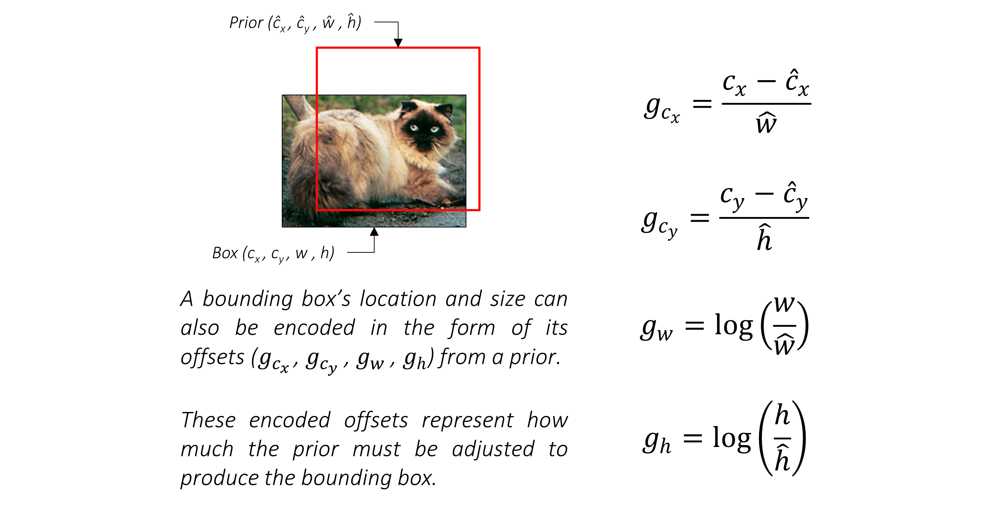

- We also concatenate objectness_score (0 or 1 or -1) and one_hot_encoded class labels with our scaled coordinates.

Note: Score of 1 is assigned to matching anchor box. Score of 0 is assigned to all anchors having ious < 0.2 which represents background class. Score of -1 is assigned to all those anchors having ious>0.2 but not assigned ground truth boxes. -1 indicates they don't need to be accounted during objectness_loss function.

In [10]:
targets = []

for i in range(len(images)):
    
    iou, gt = calculate_iou(coord[i], ab)

    class_ = tf.expand_dims(classes[i],axis=1)

    # Get the number of objects in the image
    num_objects = tf.shape(coord[i])[0]

    # Find top anchor boxes for each object
    top_k = tf.minimum(1, tf.shape(iou)[1])  # In case there are fewer than 1 anchors
    _, top_indices = tf.nn.top_k(iou, k=top_k)

    # Create a mask for top anchors per object
    top_mask = tf.reduce_sum(tf.one_hot(top_indices, depth=tf.shape(iou)[1]), axis=1)
    top_mask = tf.reduce_sum(top_mask, axis=0)
    top_mask = tf.minimum(top_mask, 1)  # Ensure mask is binary

    # Assign labels based on new criteria
    iou_condition = tf.where(top_mask > 0, 1.0,
                             tf.where(tf.reduce_max(iou, axis=0) < 0.2, 0.0, -1.0))

    max_iou = tf.reduce_max(iou, axis=0)
    gt_idx = tf.argmax(iou, axis=0)

    l = tf.cast(tf.expand_dims(labels[i], axis=1), tf.float32)
    gt2= tf.concat([gt, l,class_], axis=-1)
    gt2_ = tf.gather(gt2, gt_idx)
    gt3 = tf.reshape(gt2_, [-1, 25])

    gt3_label = gt3[..., 4:] * tf.reshape(iou_condition, [-1, 1])

    gt4 = tf.concat(
        [
            (gt3[:, :2] - ab[:, :2]) / ab[:, 2:4],
            tf.math.log((gt3[:, 2:4] + 1e-7) / ab[:, 2:]),
        ],
        axis=-1,
    )

    gt4 = gt4 / [0.1, 0.1, 0.2, 0.2]
    gt5 = tf.concat([gt4, gt3_label], axis=-1)

    targets.append(gt5)
    
    
ft = tf.cast(targets,tf.float32)
fi = tf.cast(images,tf.float32)

#### COMPARING ANCHOR BOXES VS GROUND-TRUTH BOXES

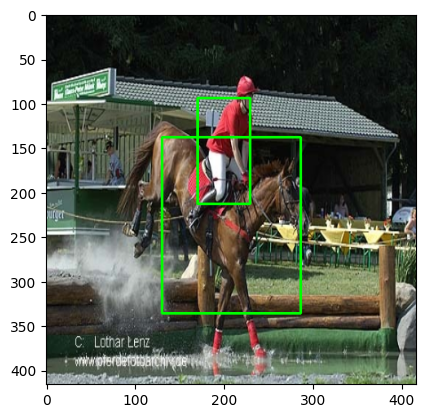

In [11]:
j = 25
t = targets[j]                            
image = images[j].copy()

for i in ab[t[...,4]>0]:             #  ANCHOR BOXES
    xmin = i[0]-i[2]/2
    ymin = i[1]-i[3]/2
    xmax = i[0]+i[2]/2
    ymax = i[1]+i[3]/2

    cv2.rectangle(image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)

plt.imshow(image)
plt.show()

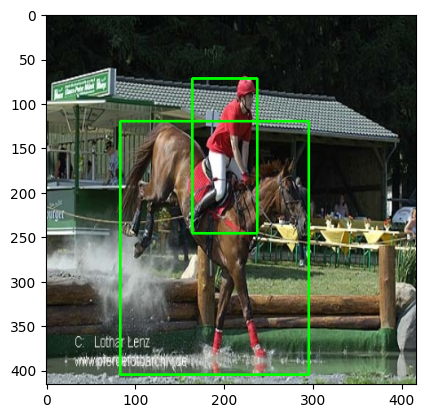

In [12]:
image = images[j].copy()

for i in coord[j]:                       # GROUND TRUTH
    xmin = i[0]-i[2]/2
    ymin = i[1]-i[3]/2
    xmax = i[0]+i[2]/2
    ymax = i[1]+i[3]/2

    cv2.rectangle(image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0, 255, 0), 2)
  
plt.imshow(image)
plt.show()

# Model Architecture

1. We will use a pre-trained backbone i.e ResNet for feature extraction from the image and select 3 layers at different positions for anchor box generation. Those 3 layers will be of different feature map size i.e (52,52) from the initial layer, (26,26) from the middle layer and (13,13) fropm the ltter layers.

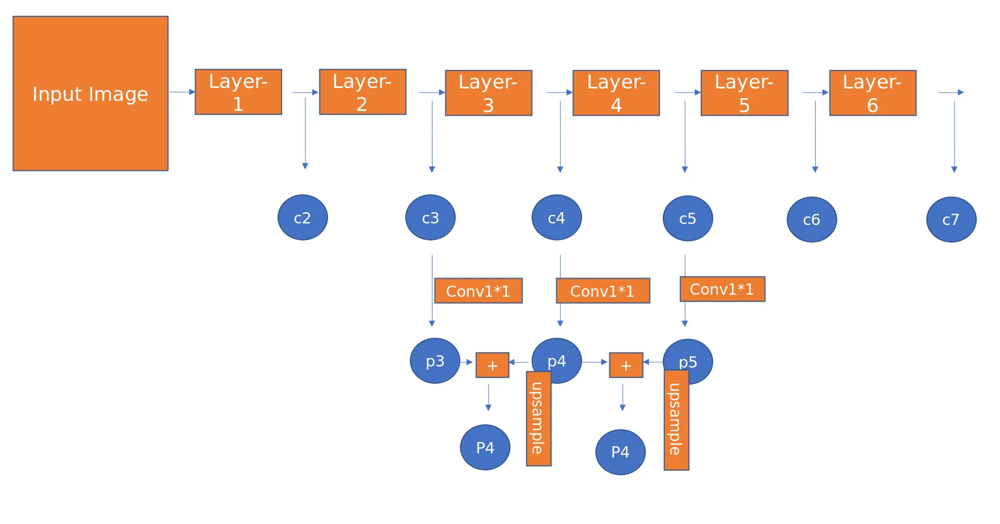

2. Each of those layers will predict object coordinates, objectness score and classes.

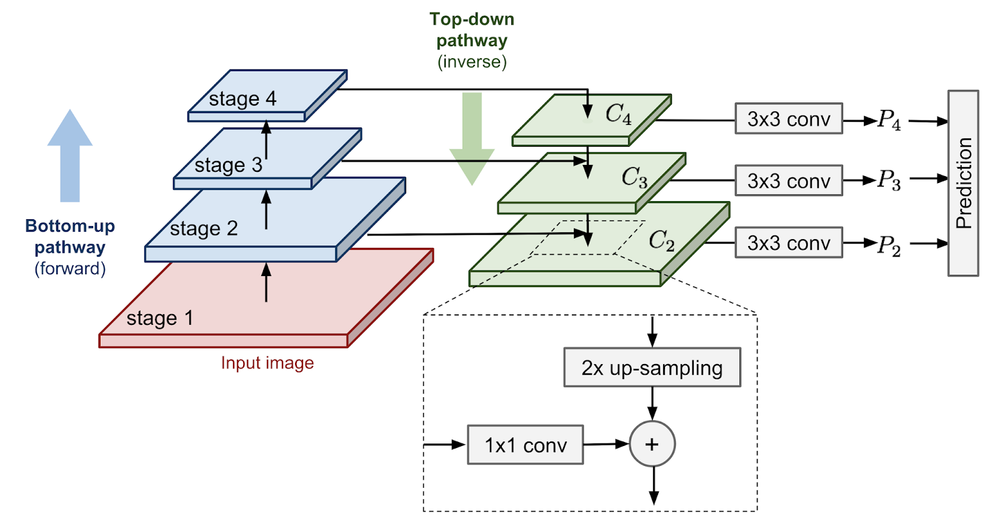

In [13]:
def get_backbone():
    """Builds ResNet50 with pre-trained imagenet weights"""
    backbone = keras.applications.ResNet50(include_top=False, input_shape=[416,416, 3])
    
    # Freeze all layers in the backbone
    backbone.trainable = False
    
    outputs = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out","conv5_block3_out"]
    ]
    return backbone, outputs

def build_head(output_filters, bias_init):
    """Builds the class/box predictions head."""
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    
    return keras.Sequential([
        keras.Input(shape=[None, None, 256]),
        keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init, activation="relu"),
        keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init, activation="relu"),
        keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init, activation="relu"),
        keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init, activation="relu"),
        keras.layers.Conv2D(
            output_filters, 3, 1, padding="same",
            kernel_initializer=kernel_init, bias_initializer=bias_init
        )
    ])

def apply_heads(feature, obj_head,cls_head, box_head):
    return obj_head(feature),cls_head(feature), box_head(feature)

def build_model():
    # Backbone
    backbone, (c3_output, c4_output, c5_output) = get_backbone()
    # FPN
    p3_output = keras.layers.Conv2D(256, 1, 1, "same")(c3_output)
    p4_output = keras.layers.Conv2D(256, 1, 1, "same")(c4_output)
    p5_output = keras.layers.Conv2D(256, 1, 1, "same")(c5_output)
    p4_output = p4_output + keras.layers.UpSampling2D(2)(p5_output)
    p3_output = p3_output + keras.layers.UpSampling2D(2)(p4_output)
    p3_output = keras.layers.Conv2D(256, 3, 1, "same")(p3_output)
    p4_output = keras.layers.Conv2D(256, 3, 1, "same")(p4_output)
    p5_output = keras.layers.Conv2D(256, 3, 1, "same")(p5_output)
    # Prediction heads
    prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
    
    obj_head = build_head(3 * 1, prior_probability)
    cls_head = build_head(3 * 20, 'zeros')
    box_head = build_head(3 * 4, "zeros")
    # Apply heads to each feature level
    outputs = []
    for feature in [p3_output, p4_output, p5_output]:
        obj_out,cls_out, box_out = apply_heads(feature, obj_head,cls_head, box_head)
        
        # Reshape
        batch_size = tf.shape(cls_out)[0]
        height = tf.shape(cls_out)[1]
        width = tf.shape(cls_out)[2]
        
        cls_out = tf.reshape(cls_out, (batch_size, height * width * 3, 20))
        box_out = tf.reshape(box_out, (batch_size, height * width * 3, 4))
        obj_out = tf.reshape(obj_out, (batch_size, height * width * 3, 1))
        
        output = tf.concat([box_out,obj_out, cls_out], axis=-1)
        outputs.append(output)
    
    # Concatenate outputs from all scales
    final_output = tf.concat(outputs, axis=1)
    
    return keras.Model(inputs=backbone.inputs, outputs=final_output)

# Create the model
model = build_model()

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 416, 416, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 422, 422, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 208, 208, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 208, 208, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                          

/Users/saptarshimallikthakur/miniconda3/lib/python3.10/site-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


 ation)                                                                                           
                                                                                                  
 conv2_block2_2_conv (Conv2  (None, 104, 104, 64)         36928     ['conv2_block2_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv2_block2_2_bn (BatchNo  (None, 104, 104, 64)         256       ['conv2_block2_2_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv2_block2_2_relu (Activ  (None, 104, 104, 64)         0         ['conv2_block2_2_bn[0][0]']   
 ation)                                                                                           
          

 conv3_block1_add (Add)      (None, 52, 52, 512)          0         ['conv3_block1_0_bn[0][0]',   
                                                                     'conv3_block1_3_bn[0][0]']   
                                                                                                  
 conv3_block1_out (Activati  (None, 52, 52, 512)          0         ['conv3_block1_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv3_block2_1_conv (Conv2  (None, 52, 52, 128)          65664     ['conv3_block1_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv3_block2_1_bn (BatchNo  (None, 52, 52, 128)          512       ['conv3_block2_1_conv[0][0]'] 
 rmalizati

                                                                                                  
 conv3_block4_3_conv (Conv2  (None, 52, 52, 512)          66048     ['conv3_block4_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block4_3_bn (BatchNo  (None, 52, 52, 512)          2048      ['conv3_block4_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block4_add (Add)      (None, 52, 52, 512)          0         ['conv3_block3_out[0][0]',    
                                                                     'conv3_block4_3_bn[0][0]']   
                                                                                                  
 conv3_blo

 rmalization)                                                                                     
                                                                                                  
 conv4_block3_1_relu (Activ  (None, 26, 26, 256)          0         ['conv4_block3_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block3_2_conv (Conv2  (None, 26, 26, 256)          590080    ['conv4_block3_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block3_2_bn (BatchNo  (None, 26, 26, 256)          1024      ['conv4_block3_2_conv[0][0]'] 
 rmalization)                                                                                     
          

 conv4_block5_out (Activati  (None, 26, 26, 1024)         0         ['conv4_block5_add[0][0]']    
 on)                                                                                              
                                                                                                  
 conv4_block6_1_conv (Conv2  (None, 26, 26, 256)          262400    ['conv4_block5_out[0][0]']    
 D)                                                                                               
                                                                                                  
 conv4_block6_1_bn (BatchNo  (None, 26, 26, 256)          1024      ['conv4_block6_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block6_1_relu (Activ  (None, 26, 26, 256)          0         ['conv4_block6_1_bn[0][0]']   
 ation)   

                                                                                                  
 conv5_block2_2_relu (Activ  (None, 13, 13, 512)          0         ['conv5_block2_2_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv5_block2_3_conv (Conv2  (None, 13, 13, 2048)         1050624   ['conv5_block2_2_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block2_3_bn (BatchNo  (None, 13, 13, 2048)         8192      ['conv5_block2_3_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_blo

                                                                                                  
 tf.compat.v1.shape_5 (TFOp  (4,)                         0         ['sequential_1[1][0]']        
 Lambda)                                                                                          
                                                                                                  
 tf.compat.v1.shape_7 (TFOp  (4,)                         0         ['sequential_1[2][0]']        
 Lambda)                                                                                          
                                                                                                  
 tf.compat.v1.shape_8 (TFOp  (4,)                         0         ['sequential_1[2][0]']        
 Lambda)                                                                                          
                                                                                                  
 tf.__oper

                                                                     'conv2d_4[0][0]',            
                                                                     'conv2d_5[0][0]']            
                                                                                                  
 tf.__operators__.getitem (  ()                           0         ['tf.compat.v1.shape[0][0]']  
 SlicingOpLambda)                                                                                 
                                                                                                  
 tf.math.multiply_3 (TFOpLa  ()                           0         ['tf.math.multiply_2[0][0]']  
 mbda)                                                                                            
                                                                                                  
 sequential (Sequential)     (None, None, None, 3)        2367235   ['conv2d_3[0][0]',            
          

 tf.reshape_6 (TFOpLambda)   (None, 507, 20)              0         ['sequential_1[2][0]',        
                                                                     'tf.__operators__.getitem_6[0
                                                                    ][0]',                        
                                                                     'tf.math.multiply_13[0][0]'] 
                                                                                                  
 tf.concat (TFOpLambda)      (None, 8112, 25)             0         ['tf.reshape_1[0][0]',        
                                                                     'tf.reshape_2[0][0]',        
                                                                     'tf.reshape[0][0]']          
                                                                                                  
 tf.concat_1 (TFOpLambda)    (None, 2028, 25)             0         ['tf.reshape_4[0][0]',        
          

# Loss Function

We will be calculating 3 losses :

**1. Localization Loss (loc_loss):**

* This loss measures the difference between the predicted bounding box coordinates and the ground truth bounding box coordinates for positive samples (objects).
* It uses the Huber loss function, which is less sensitive to outliers compared to mean squared error.
* The loss is normalized by the number of positive samples.

**2. Objectness Loss (obj_loss):**

* This loss measures the confidence of the model in predicting whether an anchor box contains an object or not.
* It uses binary cross-entropy loss for both positive and negative samples. ( 0 & 1 only. -1 label assigned anchors are not taken to account)
* For negative samples, hard negative mining is applied to select the top `3 * num_pos` (three times the number of positive samples) hardest negatives based on their cross-entropy loss. This helps focus the training on the most challenging negative examples.
* The loss is normalized by the number of positive samples.

**3. Class Loss (class_cross_entropy):**

* This loss measures the accuracy of the model in predicting the class of the object within a positive anchor box.
* It uses categorical cross-entropy loss.
* The loss is normalized by the number of positive samples.

**Total Loss:**

The total loss is the sum of the localization loss, objectness loss, and class loss. This combined loss function encourages the model to learn accurate bounding box predictions, correctly classify objects, and distinguish between objects and background.

### Hard Negative Mining


Imagine you're training a model to detect cats in images. You have lots of images with cats (positive samples) and lots without cats (negative samples).

During training, the model might easily learn to identify clear cat images. But it might struggle with images that are blurry, have cats partially hidden, or have objects that look *similar* to cats. These tricky negative samples are the "hard negatives".

Hard negative mining focuses the model's attention on these challenging negative examples. Instead of treating all negatives equally, it selects the ones that the model is *most* likely to misclassify as positive.

Here's how it works in the code:

1. **Calculate cross-entropy loss for all negative samples.** This measures how confident the model is that each negative sample *doesn't* contain a cat.

2. **Select the top 'k' negative samples with the highest loss.** These are the "hardest" negatives because the model is most uncertain about them.

3. **Only use these hard negatives for calculating the objectness loss.** This forces the model to learn better representations and become more robust to these challenging cases.

By focusing on the hardest negatives, hard negative mining helps the model improve its overall performance and generalization ability.

In [14]:
def total_loss(y_true, y_pred):
    y_true = tf.cast(y_true, dtype=tf.float32)
    y_pred = tf.cast(y_pred, dtype=tf.float32)

    pos_mask = tf.cast(tf.equal(tf.squeeze(y_true[..., 4:5], axis=-1), 1.0), tf.float32)
    
    neg_mask = tf.cast(tf.equal(tf.squeeze(y_true[..., 4:5], axis=-1), 0.0), tf.float32)

    num_pos = tf.maximum(1.0, tf.cast(tf.math.count_nonzero(pos_mask, axis=-1), tf.float32))

    loc_loss = tf.compat.v1.losses.huber_loss(labels=y_true[..., :4],
                                              predictions=y_pred[..., :4],
                                              reduction="none")
    loc_loss = tf.reduce_sum(loc_loss, axis=-1)
    loc_loss = tf.where(tf.equal(pos_mask, 1.0), loc_loss, 0.0)
    loc_loss = tf.reduce_sum(loc_loss, axis=-1)
    loc_loss = loc_loss / num_pos
    
    # OBJECT LOSS
    cce = tf.losses.BinaryCrossentropy(from_logits=True, reduction='none')
    cross_entropy = cce(y_true[..., 4:5], y_pred[..., 4:5])

    num_neg = 3*num_pos

    neg_cross_entropy = tf.where(tf.equal(neg_mask, 1.0), cross_entropy, 0.0)
    sorted_dfidx = tf.cast(tf.argsort(neg_cross_entropy, direction='DESCENDING', axis=-1), tf.int32)
    rank = tf.cast(tf.argsort(sorted_dfidx, axis=-1), tf.int32)
    num_neg = tf.cast(num_neg, dtype=tf.int32)
    
    neg_loss = tf.where(rank < tf.expand_dims(num_neg, axis=1), neg_cross_entropy, 0.0)
    pos_loss = tf.where(tf.equal(pos_mask, 1.0), cross_entropy, 0.0)

    # Combine objectness losses
    obj_loss = tf.reduce_sum(pos_loss + neg_loss, axis=-1)
    obj_loss = obj_loss / num_pos  # Normalize by number of positive samples
    
    
    # classes
    cce = tf.losses.CategoricalCrossentropy(from_logits=True, reduction='none')
    class_cross_entropy = cce(y_true[...,5:],y_pred[...,5:])
    class_cross_entropy = tf.where(tf.equal(pos_mask, 1.0), class_cross_entropy, 0.0)
    class_cross_entropy = tf.reduce_sum(class_cross_entropy, axis=-1)/num_pos

    # Combine losses
    total_loss = loc_loss + obj_loss+class_cross_entropy
    return total_loss

In [ ]:
# Define the learning rate schedule
def lr_schedule(epoch, lr):
    return lr * 0.99

# Create the learning rate scheduler callback
lr_scheduler = keras.callbacks.LearningRateScheduler(lr_schedule)

# Define your initial learning rate
initial_lr = 1e-4

# Compile the model with Adam optimizer and your custom learning rate
optimizer = keras.optimizers.Adam(learning_rate=initial_lr)

model.compile(loss=total_loss, optimizer=optimizer)

model.fit(fi, ft, epochs=50, callbacks=[lr_scheduler])

In [15]:
#model.save('retinanet final.h5')

from tensorflow.keras.utils import CustomObjectScope

with CustomObjectScope({'total_loss': total_loss}):
    model = tf.keras.models.load_model('retinanet final.h5')

# Inference  

##### (challenging examples)

In [16]:
def decode_predictions(y_pred, anchor_boxes):
    # Assuming y_pred has shape [batch_size, num_anchors, 4]
    # and anchor_boxes has shape [num_anchors, 4]
    
    # Split the predictions into center and size components
    pred_xy = y_pred[..., :2]
    pred_wh = y_pred[..., 2:]
    
    # Decode center coordinates
    decoded_xy = pred_xy * anchor_boxes[..., 2:4] + anchor_boxes[..., :2]
    
    # Decode width and height
    decoded_wh = tf.math.exp(pred_wh) * anchor_boxes[..., 2:4]
    
    # Combine to get final bounding box coordinates
    decoded_boxes = tf.concat([decoded_xy, decoded_wh], axis=-1)
    
    return decoded_boxes

2024-07-08 11:06:06.627272: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 1s 715ms/step


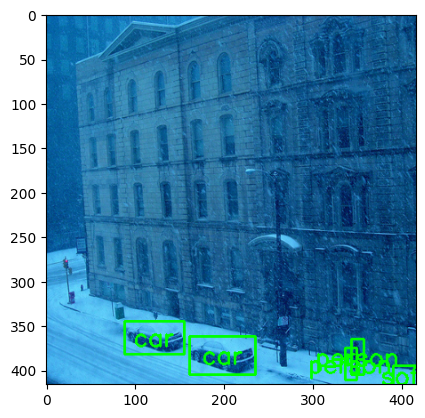

1/1 [==============================] - 0s 38ms/step


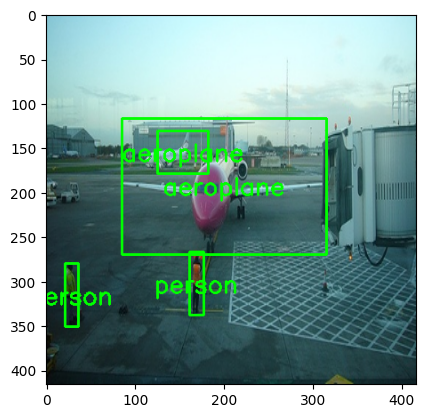

1/1 [==============================] - 0s 57ms/step


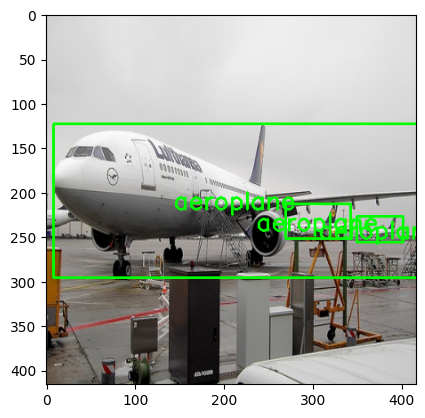

1/1 [==============================] - 0s 53ms/step


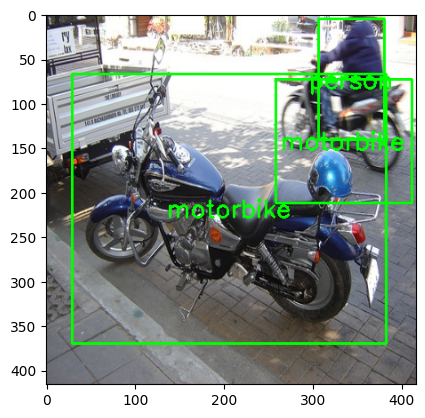

1/1 [==============================] - 0s 51ms/step


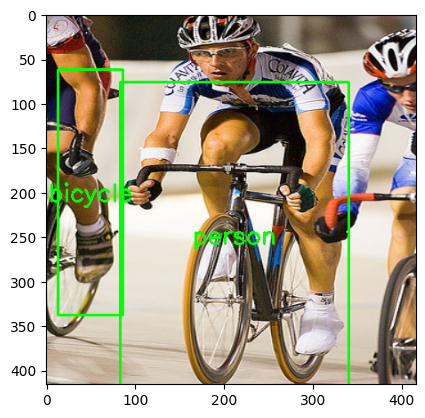

1/1 [==============================] - 0s 55ms/step


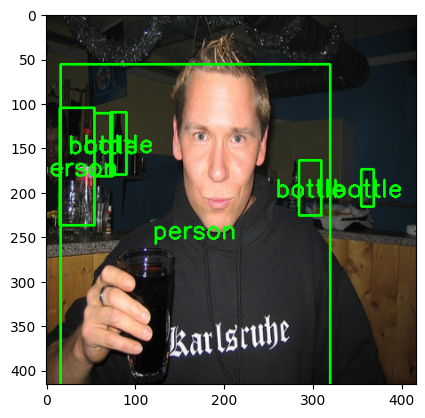

1/1 [==============================] - 0s 53ms/step


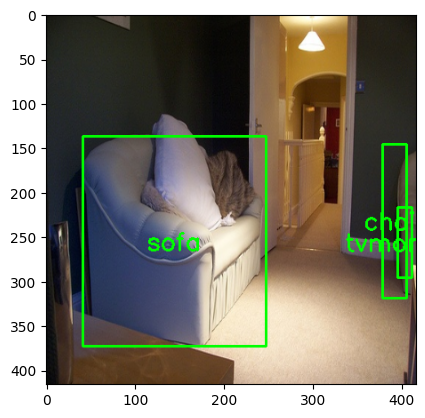

1/1 [==============================] - 0s 52ms/step


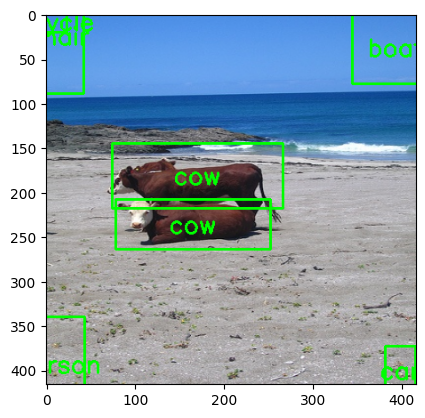

1/1 [==============================] - 0s 54ms/step


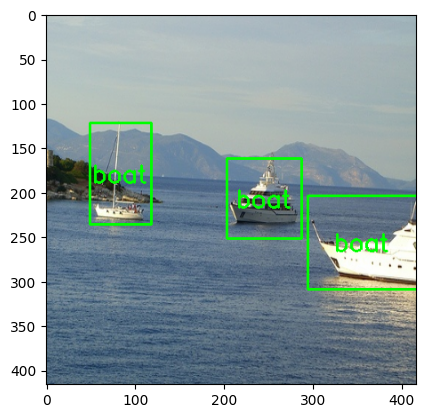

1/1 [==============================] - 0s 57ms/step


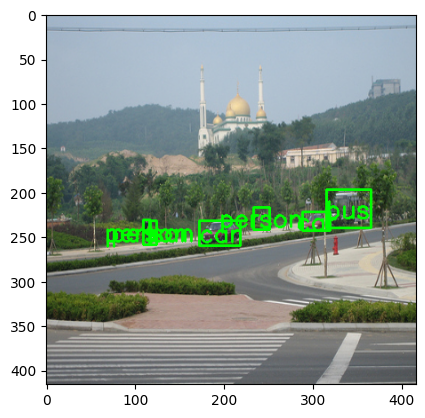

1/1 [==============================] - 0s 58ms/step


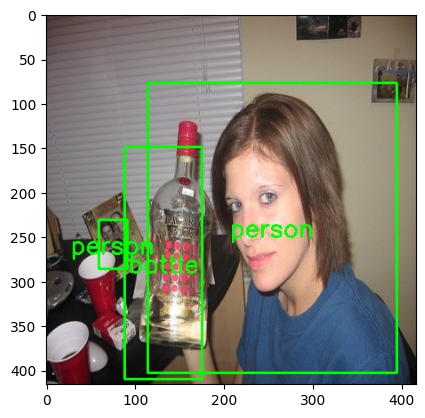

1/1 [==============================] - 0s 39ms/step


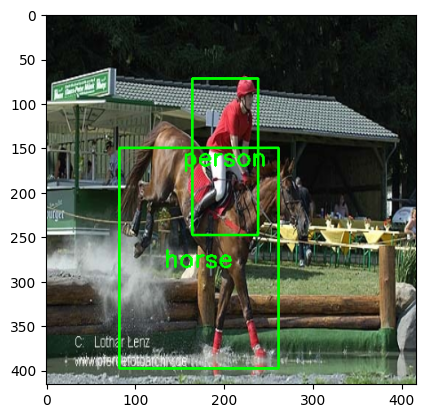

1/1 [==============================] - 0s 52ms/step


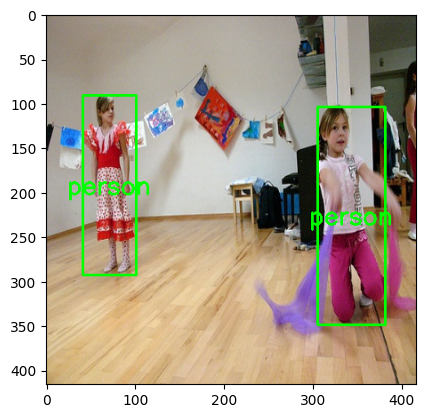

1/1 [==============================] - 0s 40ms/step


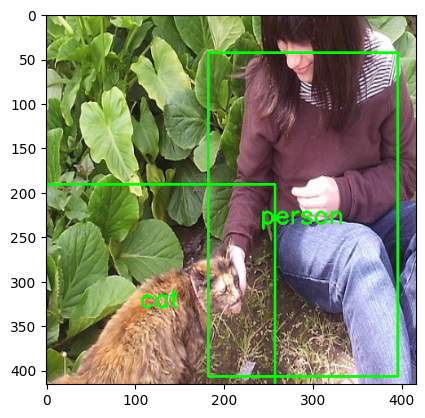

1/1 [==============================] - 0s 57ms/step


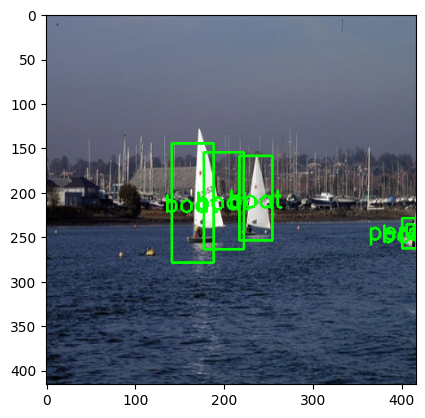

1/1 [==============================] - 0s 40ms/step


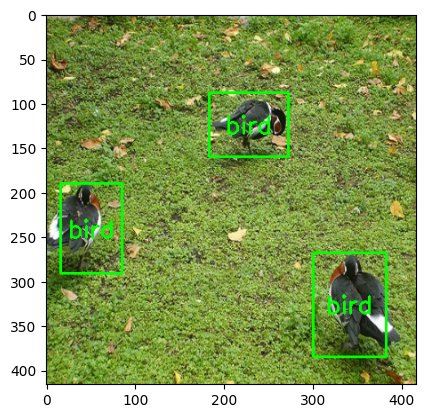

1/1 [==============================] - 0s 70ms/step


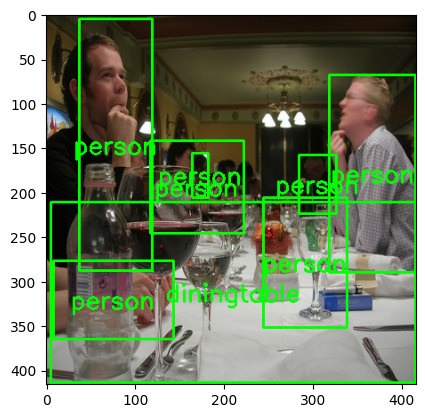

1/1 [==============================] - 0s 55ms/step


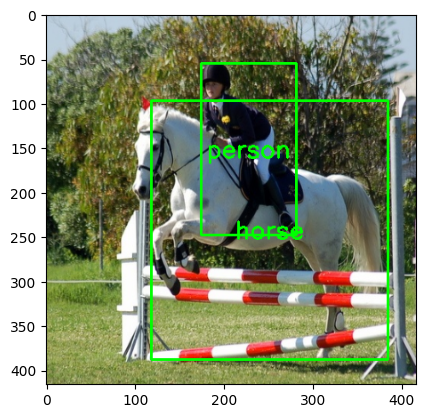

1/1 [==============================] - 0s 64ms/step


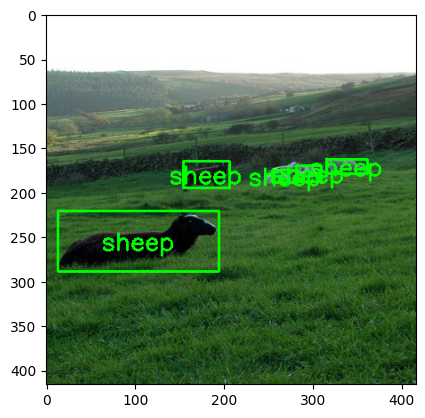

1/1 [==============================] - 0s 58ms/step


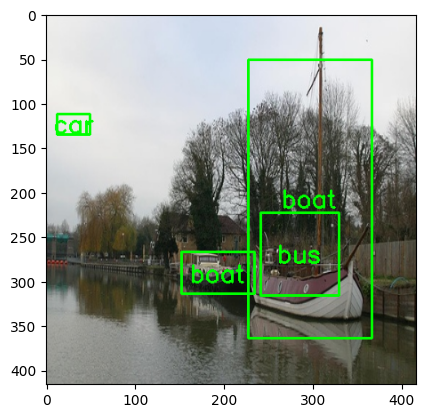

1/1 [==============================] - 0s 53ms/step


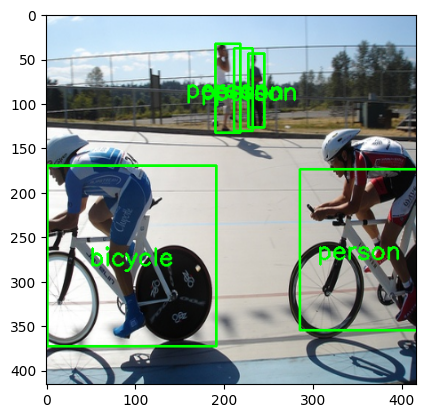

1/1 [==============================] - 0s 39ms/step


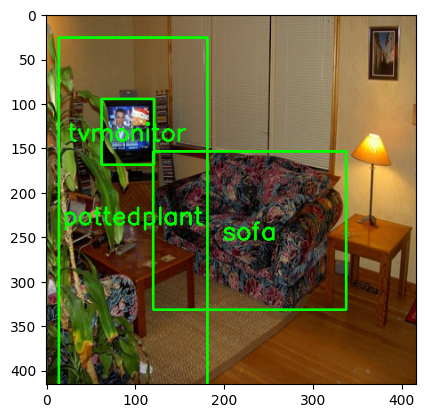

1/1 [==============================] - 0s 38ms/step


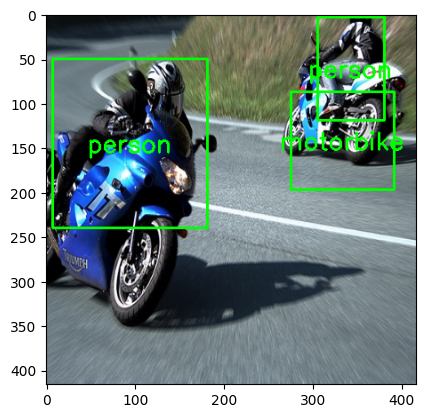

1/1 [==============================] - 0s 41ms/step


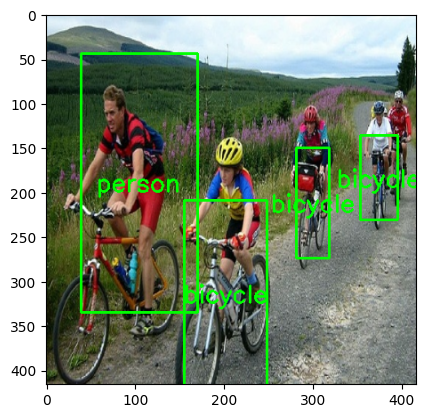

1/1 [==============================] - 0s 40ms/step


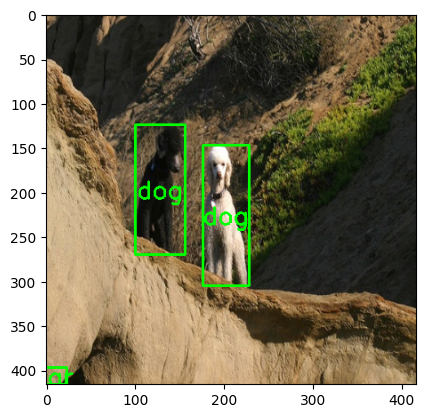

1/1 [==============================] - 0s 39ms/step


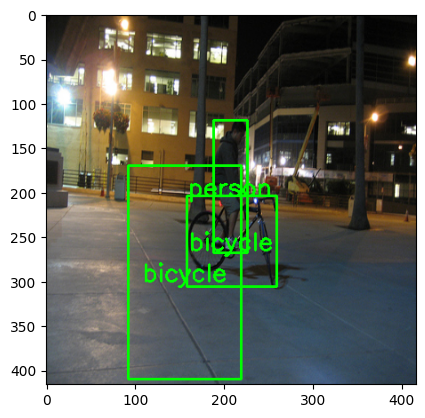

1/1 [==============================] - 0s 39ms/step


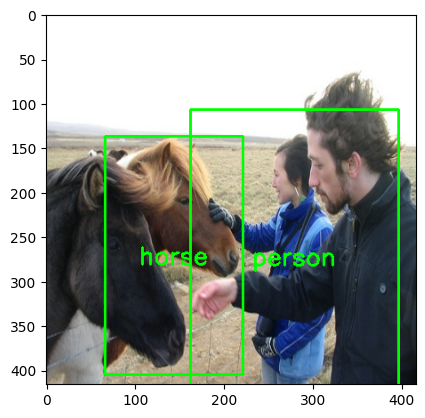

1/1 [==============================] - 0s 40ms/step


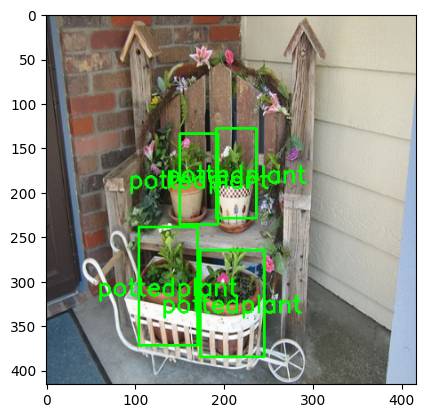

1/1 [==============================] - 0s 39ms/step


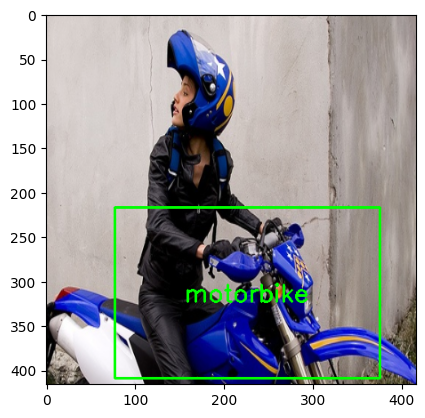

1/1 [==============================] - 0s 38ms/step


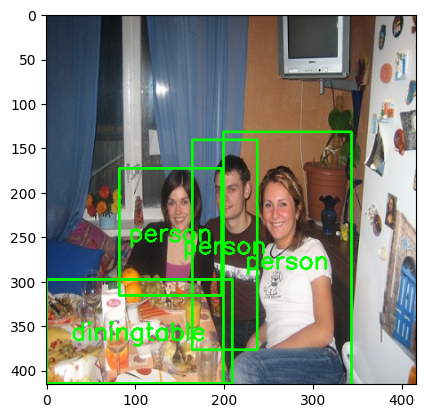

1/1 [==============================] - 0s 58ms/step


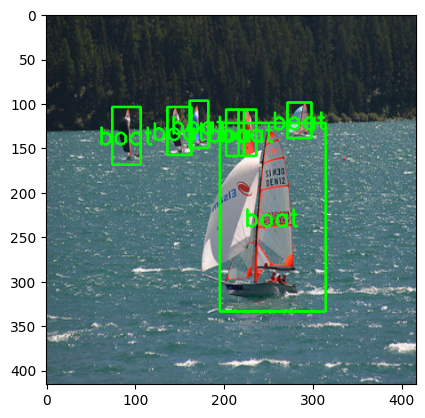

1/1 [==============================] - 0s 49ms/step


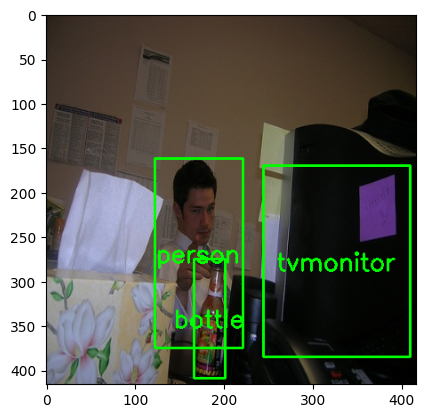

1/1 [==============================] - 0s 49ms/step


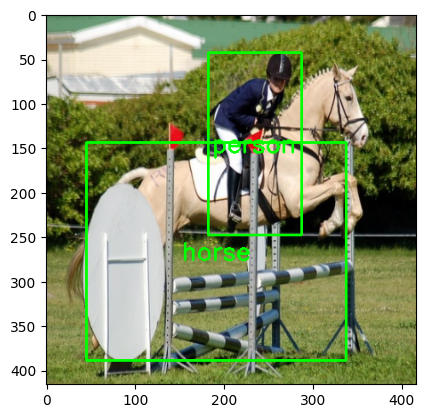

1/1 [==============================] - 0s 48ms/step


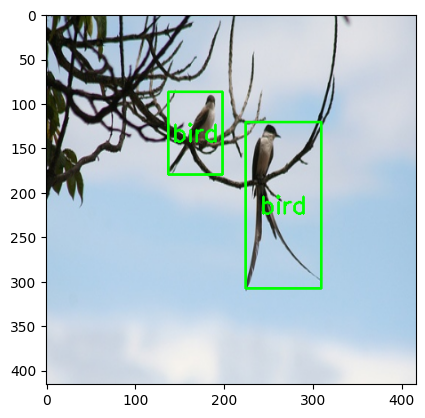

1/1 [==============================] - 0s 50ms/step


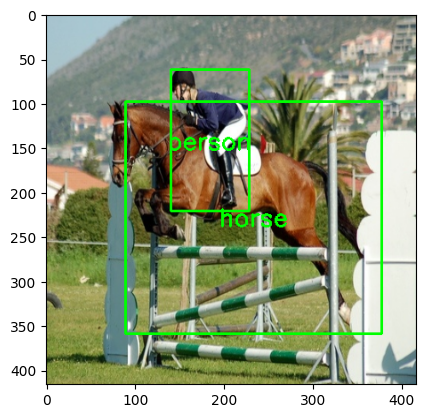

1/1 [==============================] - 0s 41ms/step


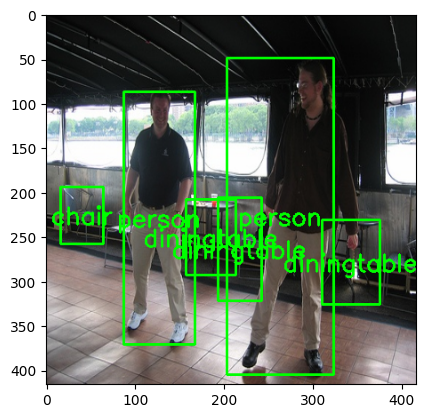

1/1 [==============================] - 0s 42ms/step


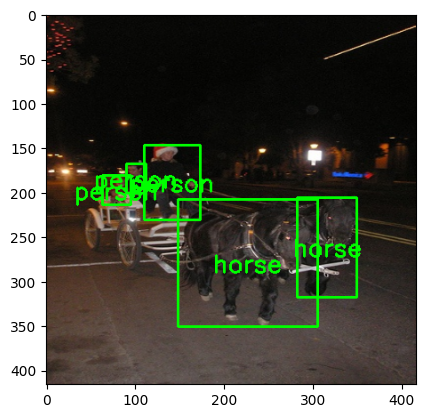

In [17]:
for j in [897,1,2,24,10,11,27,28,14,913,22,25,26,411,429,686,52,54,192,5,580,71,589,81,211,849,341,342,728,90,990,611,100,233,618,749,629]:
    
    pred = model.predict(fi[j:j+1])
    idx = tf.argsort(pred[...,4])[0][::-1][:25]
    scores = tf.sort(pred[...,4])[0][::-1][:25]
    pred1 = pred[...,:4]*[0.1, 0.1, 0.2, 0.2]
    pred2 = decode_predictions(tf.cast(pred1,tf.float32), ab)
    pred3 = np.array(pred2[0])[idx]
    
    label = pred[...,5:][0][idx]
    xmin = pred3[:,0] - pred3[:,2]/2
    ymin = pred3[:,1] - pred3[:,3]/2
    xmax = pred3[:,0] + pred3[:,2]/2
    ymax = pred3[:,1] + pred3[:,3]/2
    fp = np.vstack((xmin,ymin,xmax,ymax)).T
    idxx = tf.image.non_max_suppression(fp, scores, max_output_size=10, iou_threshold=0.2, score_threshold=float('-inf'))
    image = images[j].copy()
    for i in idxx:
        
        fpp = fp[i]
        
        label_ = label[i]
        label_ = LABELS[tf.argmax(label_)]
        # Extract bounding box coordinates and class index.
        x_min, y_min, x_max, y_max = fpp
        # Draw bounding box rectangle on the image.
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0, 255, 0), 2)
        
        # Calculate the center of the bounding box
        center_x = int((x_min + x_max) / 2)
        center_y = int((y_min + y_max) / 2)
        
        # Get text size
        (text_width, text_height), _ = cv2.getTextSize(label_, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)
        
        # Calculate text position to center it in the bounding box
        text_x = center_x - text_width // 2
        text_y = center_y + text_height // 2
        
        # Add class text in the center of the bounding box
        cv2.putText(image, label_, (text_x, text_y), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)
    
    plt.imshow(image)
    plt.show()